In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import torch
from torchvision.transforms import v2

Original image shape: torch.Size([3, 2054, 2456])
Augmented image shape: torch.Size([3, 2054, 2456])
Original Image - Min: 0.13064774870872498, Max: 0.6874189376831055
Augmented Image - Min: 0.2456720471382141, Max: 0.9883071184158325
Original Image - Unique pixel counts per channel:
Channel 1: 2111
Channel 2: 2100
Channel 3: 2137

Augmented Image - Unique pixel counts per channel:
Channel 1: 2176095
Channel 2: 2149225
Channel 3: 2088316


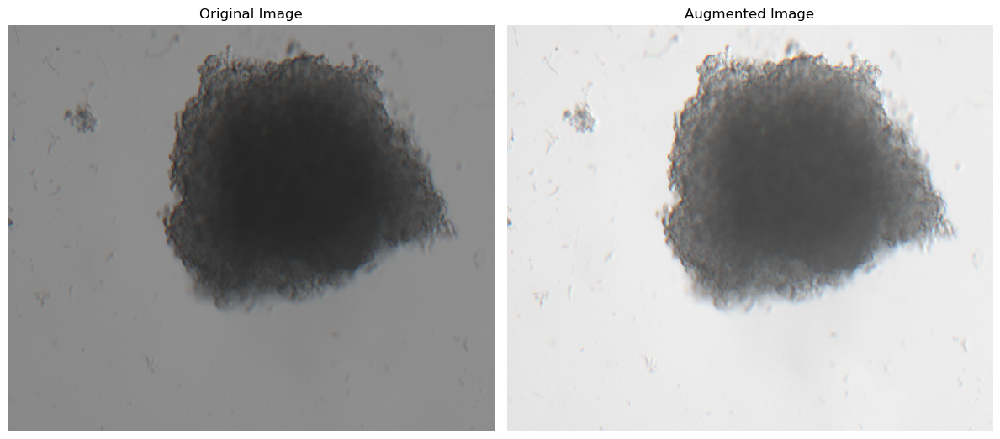

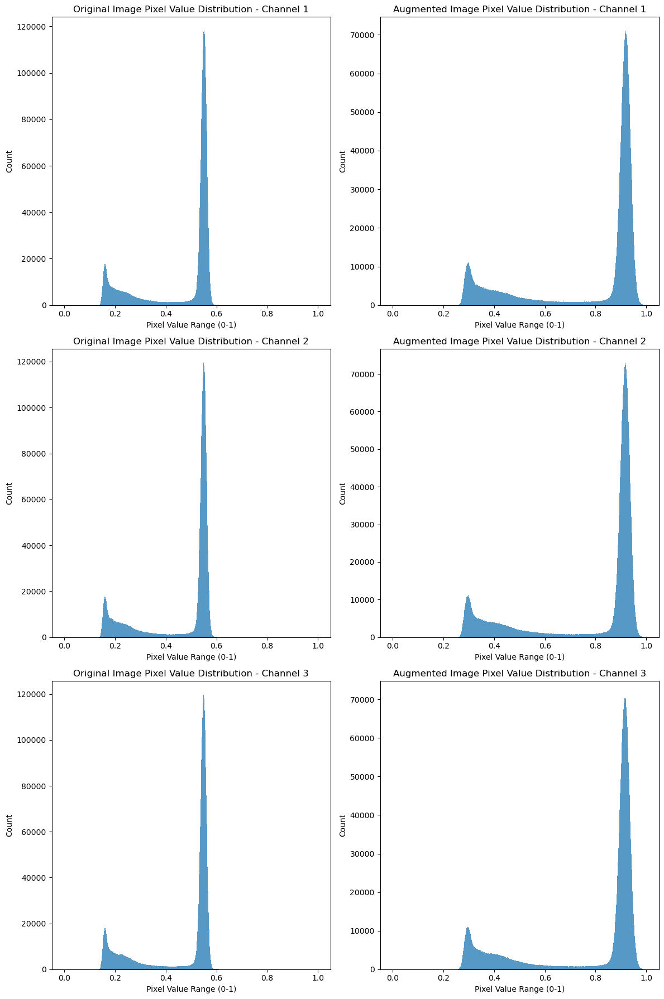

In [16]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff  # Import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
print(f'Original image shape: {original_image_tensor.shape}')

# Define transformations without using PIL
transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
])

# Apply the transformations to the original image
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor
print(f'Augmented image shape: {augmented_image_tensor.shape}')

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()

# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Function to count unique pixel intensities per channel
def count_unique_per_channel(image):
    unique_counts = []
    for channel in range(image.shape[0]):
        unique_vals = np.unique(image[channel])
        unique_counts.append(len(unique_vals))
    return unique_counts

# Get unique pixel values for each channel in the original and augmented images
unique_original_per_channel = count_unique_per_channel(image)
unique_augmented_per_channel = count_unique_per_channel(augmented_image)

# Print the number of unique pixel values for each channel
print("Original Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_original_per_channel):
    print(f"Channel {i+1}: {count}")

print("\nAugmented Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_augmented_per_channel):
    print(f"Channel {i+1}: {count}")

# Plotting function to count and plot unique values for each channel separately
def plot_pixel_value_distribution_by_channel(image, title, axs, bins=1024):
    for channel in range(image.shape[0]):
        pixel_values = image[channel].flatten()  # Flatten to 1D
        axs[channel].hist(pixel_values, bins=bins, range=(0, 1), alpha=0.75)
        axs[channel].set_title(f"{title} - Channel {channel+1}")
        axs[channel].set_xlabel('Pixel Value Range (0-1)')
        axs[channel].set_ylabel('Count')

# -------------------------------------
# First figure: Display original and augmented images
# -------------------------------------
fig1, axs1 = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns for images

# Plot original image
axs1[0].imshow(np.transpose(image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[0].set_title('Original Image')
axs1[0].axis('off')

# Plot augmented image
axs1[1].imshow(np.transpose(augmented_image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[1].set_title('Augmented Image')
axs1[1].axis('off')

# Adjust layout for the image figure
plt.tight_layout()
plt.show()

# -------------------------------------
# Second figure: Plot pixel value distributions for each channel
# -------------------------------------
fig2, axs2 = plt.subplots(3, 2, figsize=(12, 18))  # 3 rows (channels), 2 columns (original, augmented)

# Plot original image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(image, 'Original Image Pixel Value Distribution', axs2[:, 0], bins=1024)

# Plot augmented image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(augmented_image, 'Augmented Image Pixel Value Distribution', axs2[:, 1], bins=1024)

# Adjust layout for the pixel value distribution figure
plt.tight_layout()
plt.show()


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import torch
#from torchvision.transforms import v2
from torchvision import transforms 
import tifffile as tiff  # Import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")
print(f'original image shape: {image.shape}')

# Convert to float32 for compatibility with transformations
#image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
#original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
#print(f'Original image shape: {original_image_tensor.shape}')

# Define transformations without using PIL
#transform = v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])
transform = transforms.Compose([
  # Example transformation (if needed)
    transforms.ToTensor()            # Convert back to Tensor
])

# Apply the transformations to the original image
augmented_image_tensor = transform(image)  # Transformation directly on tensor
print(f'Augmented image shape: {augmented_image_tensor.shape}')

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()

# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

"""# Function to count unique pixel intensities per channel
def count_unique_per_channel(image):
    unique_counts = []
    for channel in range(image.shape[0]):
        unique_vals = np.unique(image[channel])
        unique_counts.append(len(unique_vals))
    return unique_counts

# Get unique pixel values for each channel in the original and augmented images
unique_original_per_channel = count_unique_per_channel(image)
unique_augmented_per_channel = count_unique_per_channel(augmented_image)

# Print the number of unique pixel values for each channel
print("Original Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_original_per_channel):
    print(f"Channel {i+1}: {count}")

print("\nAugmented Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_augmented_per_channel):
    print(f"Channel {i+1}: {count}")

# Plotting function to count and plot unique values for each channel separately
def plot_pixel_value_distribution_by_channel(image, title, axs, bins=1024):
    for channel in range(image.shape[0]):
        pixel_values = image[channel].flatten()  # Flatten to 1D
        axs[channel].hist(pixel_values, bins=bins, range=(0, 1), alpha=0.75)
        axs[channel].set_title(f"{title} - Channel {channel+1}")
        axs[channel].set_xlabel('Pixel Value Range (0-1)')
        axs[channel].set_ylabel('Count')

# -------------------------------------
# First figure: Display original and augmented images
# -------------------------------------
fig1, axs1 = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns for images

# Plot original image
axs1[0].imshow(np.transpose(image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[0].set_title('Original Image')
axs1[0].axis('off')

# Plot augmented image
axs1[1].imshow(np.transpose(augmented_image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[1].set_title('Augmented Image')
axs1[1].axis('off')

# Adjust layout for the image figure
plt.tight_layout()
plt.show()

# -------------------------------------
# Second figure: Plot pixel value distributions for each channel
# -------------------------------------
fig2, axs2 = plt.subplots(3, 2, figsize=(12, 18))  # 3 rows (channels), 2 columns (original, augmented)

# Plot original image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(image, 'Original Image Pixel Value Distribution', axs2[:, 0], bins=1024)

# Plot augmented image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(augmented_image, 'Augmented Image Pixel Value Distribution', axs2[:, 1], bins=1024)

# Adjust layout for the pixel value distribution figure
plt.tight_layout()
plt.show()"""


original image shape: (3, 2054, 2456)
Augmented image shape: torch.Size([2456, 3, 2054])
Original Image - Min: 8562, Max: 45050
Augmented Image - Min: 8562, Max: 45050


'# Function to count unique pixel intensities per channel\ndef count_unique_per_channel(image):\n    unique_counts = []\n    for channel in range(image.shape[0]):\n        unique_vals = np.unique(image[channel])\n        unique_counts.append(len(unique_vals))\n    return unique_counts\n\n# Get unique pixel values for each channel in the original and augmented images\nunique_original_per_channel = count_unique_per_channel(image)\nunique_augmented_per_channel = count_unique_per_channel(augmented_image)\n\n# Print the number of unique pixel values for each channel\nprint("Original Image - Unique pixel counts per channel:")\nfor i, count in enumerate(unique_original_per_channel):\n    print(f"Channel {i+1}: {count}")\n\nprint("\nAugmented Image - Unique pixel counts per channel:")\nfor i, count in enumerate(unique_augmented_per_channel):\n    print(f"Channel {i+1}: {count}")\n\n# Plotting function to count and plot unique values for each channel separately\ndef plot_pixel_value_distributio

Original image shape: torch.Size([3, 2054, 2456])
Augmented image shape: torch.Size([3, 2054, 2456])
Original Image - Min: 0.13064774870872498, Max: 0.6874189376831055
Augmented Image - Min: 0.0, Max: 1.0
Original Image - Unique pixel counts per channel:
Channel 1: 2111
Channel 2: 2100
Channel 3: 2137

Augmented Image - Unique pixel counts per channel:
Channel 1: 808487
Channel 2: 786796
Channel 3: 804588


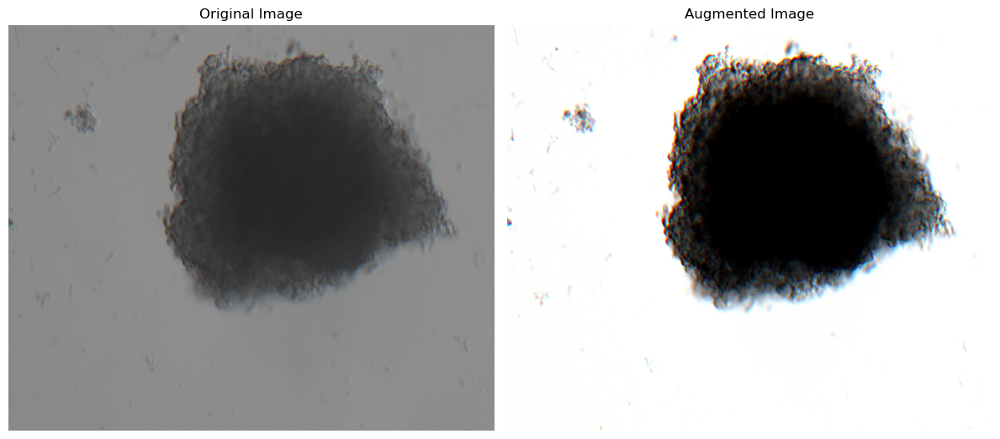

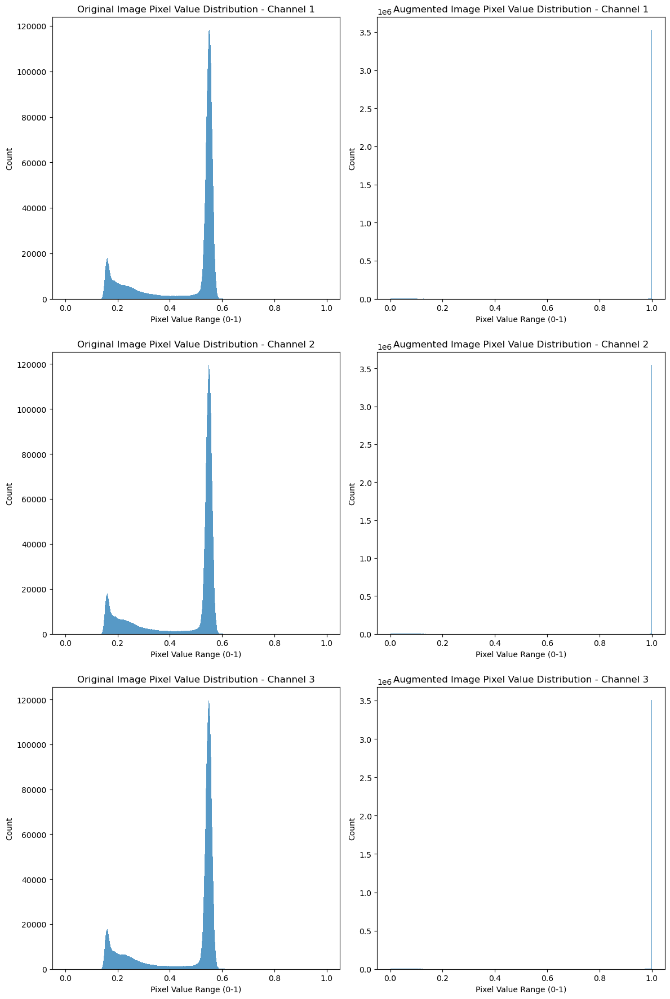

In [15]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff  # Import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
print(f'Original image shape: {original_image_tensor.shape}')

# Define transformations without using PIL
transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
])

# Apply the transformations to the original image
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor
print(f'Augmented image shape: {augmented_image_tensor.shape}')

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()

# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Function to count unique pixel intensities per channel
def count_unique_per_channel(image):
    unique_counts = []
    for channel in range(image.shape[0]):
        unique_vals = np.unique(image[channel])
        unique_counts.append(len(unique_vals))
    return unique_counts

# Get unique pixel values for each channel in the original and augmented images
unique_original_per_channel = count_unique_per_channel(image)
unique_augmented_per_channel = count_unique_per_channel(augmented_image)

# Print the number of unique pixel values for each channel
print("Original Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_original_per_channel):
    print(f"Channel {i+1}: {count}")

print("\nAugmented Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_augmented_per_channel):
    print(f"Channel {i+1}: {count}")

# Plotting function to count and plot unique values for each channel separately
def plot_pixel_value_distribution_by_channel(image, title, axs, bins=1024):
    for channel in range(image.shape[0]):
        pixel_values = image[channel].flatten()  # Flatten to 1D
        axs[channel].hist(pixel_values, bins=bins, range=(0, 1), alpha=0.75)
        axs[channel].set_title(f"{title} - Channel {channel+1}")
        axs[channel].set_xlabel('Pixel Value Range (0-1)')
        axs[channel].set_ylabel('Count')

# -------------------------------------
# First figure: Display original and augmented images
# -------------------------------------
fig1, axs1 = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns for images

# Plot original image
axs1[0].imshow(np.transpose(image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[0].set_title('Original Image')
axs1[0].axis('off')

# Plot augmented image
axs1[1].imshow(np.transpose(augmented_image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs1[1].set_title('Augmented Image')
axs1[1].axis('off')

# Adjust layout for the image figure
plt.tight_layout()
plt.show()

# -------------------------------------
# Second figure: Plot pixel value distributions for each channel
# -------------------------------------
fig2, axs2 = plt.subplots(3, 2, figsize=(12, 18))  # 3 rows (channels), 2 columns (original, augmented)

# Plot original image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(image, 'Original Image Pixel Value Distribution', axs2[:, 0], bins=1024)

# Plot augmented image pixel value distribution for each channel
plot_pixel_value_distribution_by_channel(augmented_image, 'Augmented Image Pixel Value Distribution', axs2[:, 1], bins=1024)

# Adjust layout for the pixel value distribution figure
plt.tight_layout()
plt.show()


Original image shape: torch.Size([3, 2054, 2456])
Augmented image shape: torch.Size([3, 2054, 2456])
Original Image - Min: 0.13064774870872498, Max: 0.6874189376831055
Augmented Image - Min: 0.1969958394765854, Max: 0.3747836649417877
Original Image - Unique pixel counts per channel:
Channel 1: 2111
Channel 2: 2100
Channel 3: 2137

Augmented Image - Unique pixel counts per channel:
Channel 1: 1672294
Channel 2: 1646188
Channel 3: 1686717


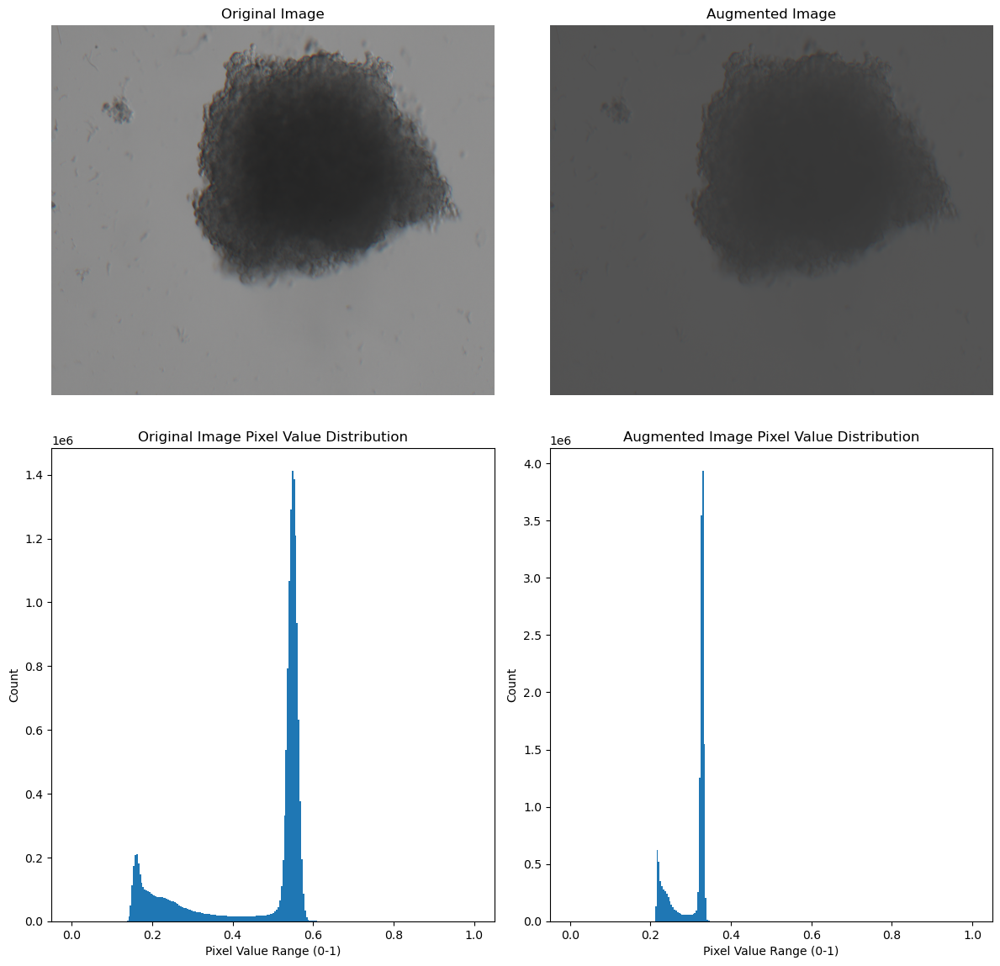

In [13]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff  # Import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
print(f'Original image shape: {original_image_tensor.shape}')

# Define transformations without using PIL
transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
])

# Apply the transformations to the original image
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor
print(f'Augmented image shape: {augmented_image_tensor.shape}')

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()

# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Function to count unique pixel intensities per channel
def count_unique_per_channel(image):
    unique_counts = []
    for channel in range(image.shape[0]):
        unique_vals = np.unique(image[channel])
        unique_counts.append(len(unique_vals))
    return unique_counts

# Get unique pixel values for each channel in the original and augmented images
unique_original_per_channel = count_unique_per_channel(image)
unique_augmented_per_channel = count_unique_per_channel(augmented_image)

# Print the number of unique pixel values for each channel
print("Original Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_original_per_channel):
    print(f"Channel {i+1}: {count}")

print("\nAugmented Image - Unique pixel counts per channel:")
for i, count in enumerate(unique_augmented_per_channel):
    print(f"Channel {i+1}: {count}")

def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values
    pixel_values = image.reshape(-1, 3)  # Reshape to 2D array (N, 3)
    histogram, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 1))

    # Plotting the distribution as a bar plot
    ax.bar(bin_edges[:-1], histogram, width=np.diff(bin_edges), align='edge')
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-1)')
    ax.set_ylabel('Count')

# Create subplots for displaying images and pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Plot original image
axs[0, 0].imshow(np.transpose(image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(np.transpose(augmented_image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


original image shape: torch.Size([3, 2054, 2456])
Augmented image shape: torch.Size([3, 2054, 2456])
Original Image - Min: 0.13064774870872498, Max: 0.6874189376831055
Augmented Image - Min: 0.2370210886001587, Max: 0.4322153925895691
Number of unique pixel values in the original image: 2173
Number of unique pixel values in the augmented image: 3229982


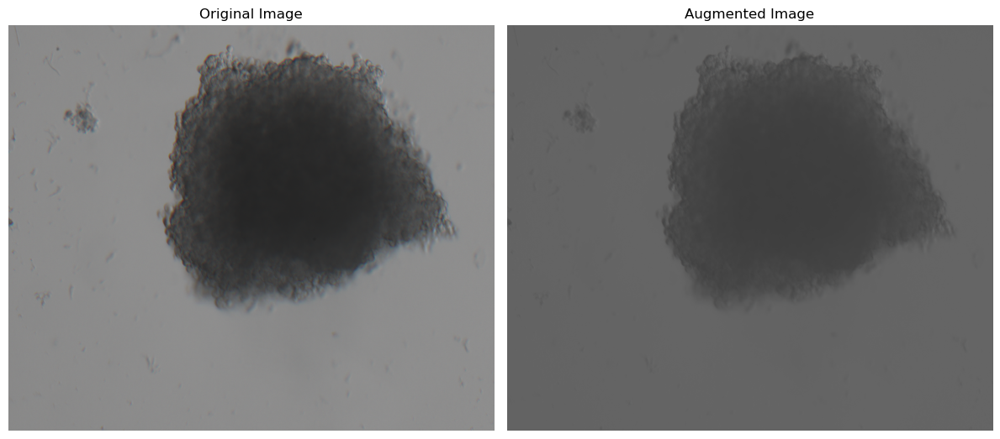

In [7]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff  # Import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
print(f'original image shape: {original_image_tensor.shape}')

# Define transformations without using PIL
transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
])

# Apply the transformations to the original image
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor
print(f'Augmented image shape: {augmented_image_tensor.shape}')
# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()

# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Get unique pixel values and their counts for original and augmented images
unique_original, counts_original = np.unique(image, return_counts=True)
unique_augmented, counts_augmented = np.unique(augmented_image, return_counts=True)

# Print the number of unique pixel values
num_unique_original = len(unique_original)
num_unique_augmented = len(unique_augmented)
print(f"Number of unique pixel values in the original image: {num_unique_original}")
print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

# Plot the original and augmented images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot original image
axs[0].imshow(np.transpose(image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs[0].set_title('Original Image')
axs[0].axis('off')

# Plot augmented image
axs[1].imshow(np.transpose(augmented_image, (1, 2, 0)), cmap='gray')  # Transpose for correct display
axs[1].set_title('Augmented Image')
axs[1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


torch.Size([3, 2054, 2456])
torch.Size([3, 2054, 2456])
Original Image - Min: 0.13064774870872498, Max: 0.6874189376831055
Augmented Image - Min: 0.022128667682409286, Max: 0.11041323840618134
Number of unique pixel values in the original image: 3839699
Number of unique pixel values in the augmented image: 5044624


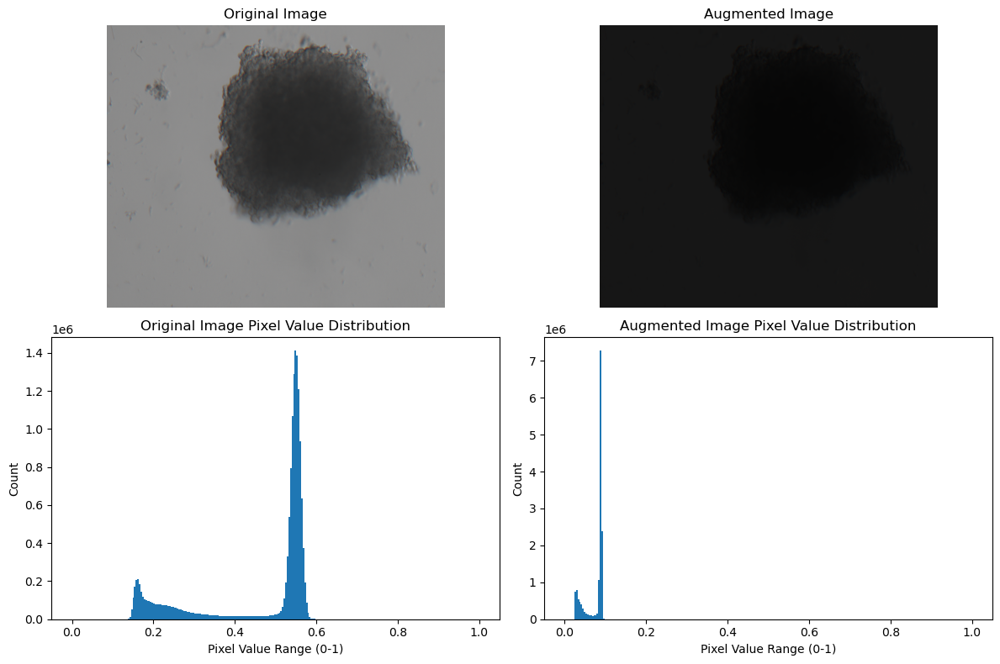

In [9]:
#sOMETHING WRONG WITH CALCULATION OF UNIQUE NUMBER:  


from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Convert the 3-channel image to a tensor
original_image_tensor = torch.from_numpy(image)  # No unsqueeze, keep it as 3 channels
print(original_image_tensor.shape)
# Define transformations without using PIL
transform = v2.Compose([
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
])

# Apply the transformations to the original image
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.numpy()
print(augmented_image_tensor.shape)
# Print min and max pixel values
print(f"Original Image - Min: {image.min()}, Max: {image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Get unique pixel values and their counts for original and augmented images
unique_original, counts_original = np.unique(image.reshape(-1, 3), axis=0, return_counts=True)
unique_augmented, counts_augmented = np.unique(augmented_image.reshape(-1, 3), axis=0, return_counts=True)

# Print the number of unique pixel values
num_unique_original = len(unique_original)
num_unique_augmented = len(unique_augmented)
print(f"Number of unique pixel values in the original image: {num_unique_original}")
print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

# Plotting function to count and plot unique values
def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values
    pixel_values = image.reshape(-1, 3)  # Reshape to 2D array (N, 3)
    histogram, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 1))

    # Plotting the distribution as a bar plot
    ax.bar(bin_edges[:-1], histogram, width=np.diff(bin_edges), align='edge')
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-1)')
    ax.set_ylabel('Count')

# Plot the original and augmented image along with their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot original image
axs[0, 0].imshow(np.transpose(image, (1, 2, 0)))  # Transpose for correct display
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(np.transpose(augmented_image, (1, 2, 0)))  # Transpose for correct display
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


In [19]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Prepare a list to store reduction percentages
reduction_percentages = []

# Run the transformation for up to 1000 loops
for i in range(1000):
    # Convert the sharpest layer to a tensor
    original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

    # Define transformations without using PIL
    transform = v2.Compose([
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
    ])

    # Apply the transformations to the sharpest layer
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(original_image, return_counts=True)
    unique_augmented, counts_augmented = np.unique(augmented_image, return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)
    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Break the loop if reduction percentage exceeds 45%
    if reduction_percentage > 49:
        # Print reduction percentage and relevant details
        print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")
        print(f"Original Image - Min: {original_image.min()}, Max: {original_image.max()}")
        print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")
        print(f"Number of unique pixel values in the original image: {num_unique_original}")
        print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

        # Define the function to plot pixel value distributions
        def plot_pixel_value_distribution(image, title, ax):
            # Flatten the image and count unique values
            pixel_values, counts = np.unique(image.flatten(), return_counts=True)

            # Define the bins for the plot (range between 0 and 1)
            bins = np.linspace(0, 1, 50)  # 50 bins between 0 and 1
            bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

            # Plotting the distribution as a bar plot
            ax.bar(bins[:-1], bin_counts, width=(bins[1] - bins[0]))
            ax.set_title(title)
            ax.set_xlabel('Pixel Value Range (0-1)')
            ax.set_ylabel('Count')

        # Plot the original and augmented images along with their pixel value distributions
        fig, axs = plt.subplots(2, 2, figsize=(12, 8))

        # Plot original image
        axs[0, 0].imshow(original_image, cmap='gray')
        axs[0, 0].set_title('Original Image (Sharpest Layer)')
        axs[0, 0].axis('off')

        # Plot augmented image
        axs[0, 1].imshow(augmented_image, cmap='gray')
        axs[0, 1].set_title('Augmented Image')
        axs[0, 1].axis('off')

        # Plot original image pixel value distribution
        plot_pixel_value_distribution(original_image, 'Original Image Pixel Value Distribution', axs[1, 0])

        # Plot augmented image pixel value distribution
        plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

        # Adjust layout
        plt.tight_layout()
        plt.show()

        break  # Exit the loop once the condition is met


20% reduction max

Original Image - Min: 0.13064774870872498, Max: 0.6666666865348816
Augmented Image - Min: 0.1464729607105255, Max: 0.5816976428031921
Number of unique pixel values in the original image: 2111
Number of unique pixel values in the augmented image: 9140


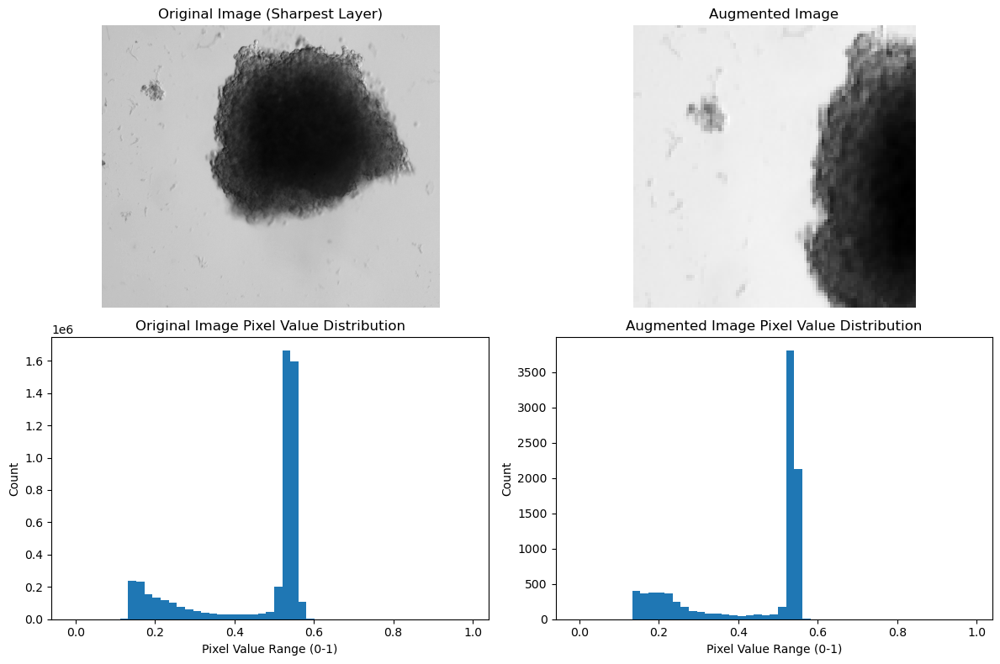

In [5]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff  # Make sure to import tifffile for reading TIFF images

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32)/65535.0

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Convert the sharpest layer (original image) to a tensor
original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

# Define transformations without using PIL
transform = v2.Compose([
    #v2.RandomPhotometricDistort(p=1)
    #v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=0.8),
    #v2.RandomHorizontalFlip(p=1),
    #v2.RandomResizedCrop(size=96)
])

# Apply the transformations to the sharpest layer
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.squeeze().numpy()

# Print min and max pixel values
print(f"Original Image - Min: {original_image.min()}, Max: {original_image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Get unique pixel values and their counts for original and augmented images
unique_original, counts_original = np.unique(original_image, return_counts=True)
unique_augmented, counts_augmented = np.unique(augmented_image, return_counts=True)

# Print the number of unique pixel values
num_unique_original = len(unique_original)
num_unique_augmented = len(unique_augmented)
print(f"Number of unique pixel values in the original image: {num_unique_original}")
print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

# Plotting function to count and plot unique values
def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values
    pixel_values, counts = np.unique(image.flatten(), return_counts=True)
    
    # Define the bins for the plot (range between 0 and 1)
    bins = np.linspace(0, 1, 50)  # 50 bins between 0 and 1
    bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

    # Plotting the distribution as a bar plot
    ax.bar(bins[:-1], bin_counts, width=(bins[1] - bins[0]))
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-1)')
    ax.set_ylabel('Count')

# Plot the original and augmented image along with their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot original image
axs[0, 0].imshow(original_image, cmap='gray')
axs[0, 0].set_title('Original Image (Sharpest Layer)')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(augmented_image, cmap='gray')
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(original_image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


Original Image - Min: 0.13064774870872498, Max: 0.6666666865348816
Augmented Image - Min: 0.020118702203035355, Max: 0.32103562355041504


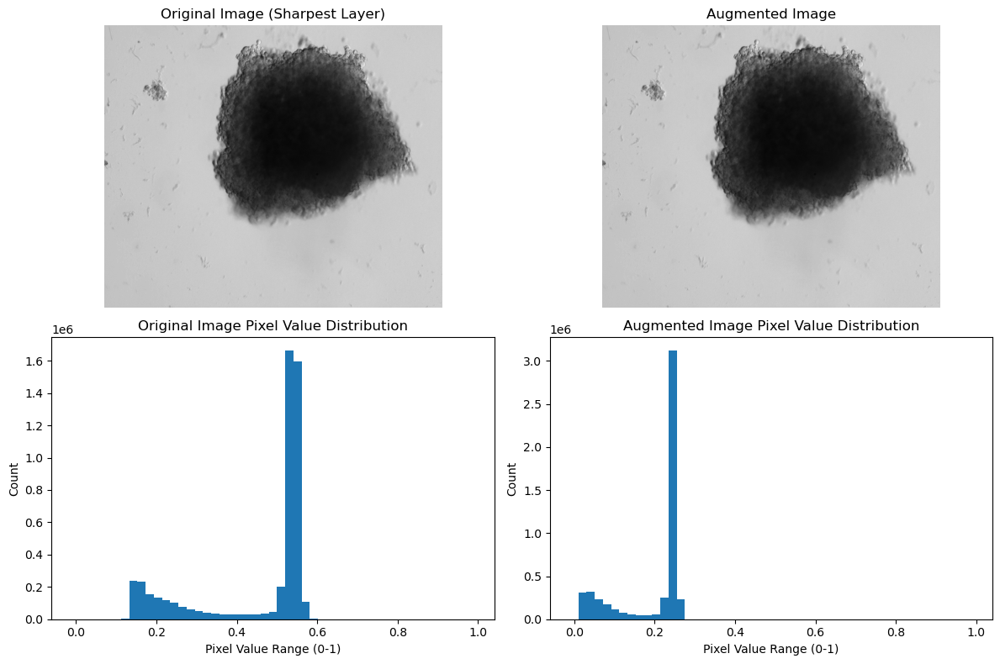

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import torch
from torchvision import transforms

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32)/ 65535.0

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Convert the sharpest layer (original image) to a tensor
original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

# Define transformations without using PIL
transform = transforms.Compose([
    #transforms.RandomHorizontalFlip(p=1),
    #transforms.RandomResizedCrop(size=96),  # Use tensor size directly
    transforms.RandomApply([transforms.ColorJitter(brightness=1, contrast=1,saturation=1,hue=0)], p=1),
    #transforms.RandomGrayscale(p=0.2),
    #transforms.GaussianBlur(kernel_size=(9, 9))
])

# Apply the transformations to the sharpest layer
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.squeeze().numpy()

print(f"Original Image - Min: {original_image.min()}, Max: {original_image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Plotting function to count and plot unique values
def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values
    pixel_values, counts = np.unique(image.flatten(), return_counts=True)
    
    # Define the bins for the plot (range between 0 and 1)
    bins = np.linspace(0, 1, 50)  # 50 bins between 0 and 1
    bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

    # Plotting the distribution as a bar plot
    ax.bar(bins[:-1], bin_counts, width=(bins[1] - bins[0]))
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-1)')
    ax.set_ylabel('Count')

# Plot the original and augmented image along with their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot original image
axs[0, 0].imshow(original_image, cmap='gray')
axs[0, 0].set_title('Original Image (Sharpest Layer)')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(augmented_image, cmap='gray')
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(original_image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


Totensor() doesn't do sacling to 0,1 but it convert to tensor so if its 16 bit so we had to divide 65355 by our self.

In [13]:
from PIL import Image
import torch
from torchvision import transforms

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Manuscript\notes\figures\1dop2.png'  # Replace with your image path
image = Image.open(img_path)

# Print original image mode and size
print(f"Original Image Mode: {image.mode}, Size: {image.size}")

# Define the transformation
to_tensor = transforms.ToTensor()

# Convert the image to a tensor
image_tensor = to_tensor(image)
print(f"Original Image - Min: {image_tensor.min()}, Max: {image_tensor.max()}")

# Print the tensor shape and data type
print(f"Tensor Shape: {image_tensor.shape}, Data Type: {image_tensor.dtype}")


Original Image Mode: RGBA, Size: (933, 293)
Original Image - Min: 0.0, Max: 1.0
Tensor Shape: torch.Size([4, 293, 933]), Data Type: torch.float32


augmented_image_tensor is a tensor.
Data type: torch.float32
Original Image - Min: 8562.0, Max: 43690.0
Augmented Image - Min: 8562.0, Max: 43690.0


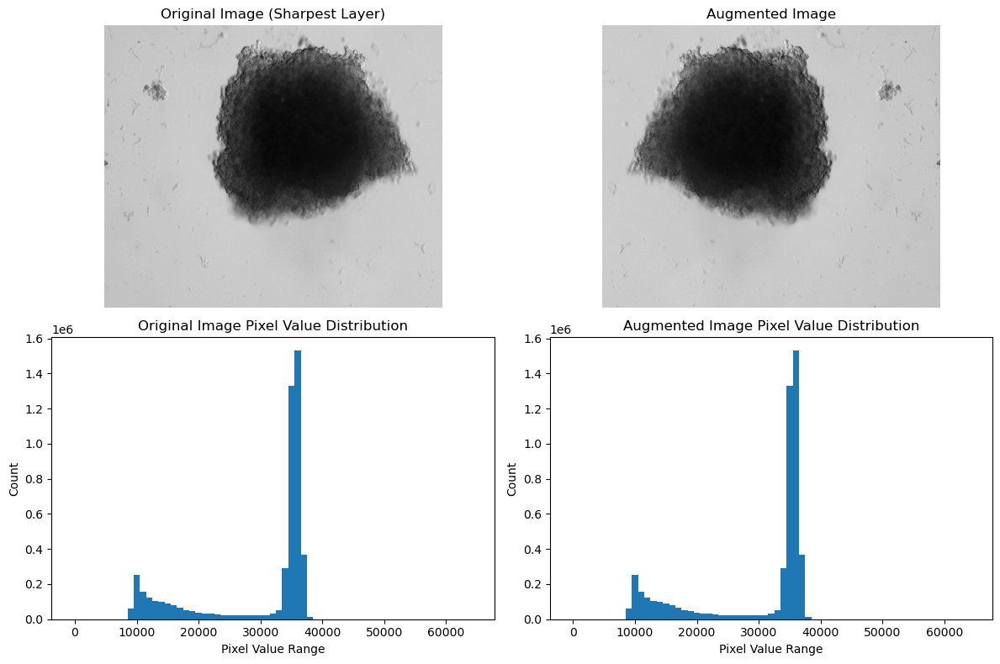

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import torch
from torchvision import transforms

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32)

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Convert the sharpest layer (original image) to a tensor
#original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

# Define transformations without using PIL
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(p=1),
    #transforms.RandomResizedCrop(size=original_image_tensor.shape[1:], scale=(0.8, 1.0)),  # Use tensor size directly
    #transforms.RandomApply([transforms.ColorJitter(brightness=0.5, contrast=0.5)], p=0.8),
    #transforms.RandomGrayscale(p=0.2),
    #transforms.GaussianBlur(kernel_size=(9, 9))
])

# Apply the transformations to the sharpest layer
augmented_image_tensor = transform(original_image)  # Transformation directly on tensor

# Check if augmented_image is a numpy array and print its type
if isinstance(augmented_image_tensor, torch.Tensor):
    print("augmented_image_tensor is a tensor.")
    print(f"Data type: {augmented_image_tensor.dtype}")
else:
    print("augmented_image_tensor is not a tensor.")

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.squeeze().numpy()

print(f"Original Image - Min: {original_image.min()}, Max: {original_image.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Plotting function to count and plot unique values
def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values in the range 0–65535
    pixel_values, counts = np.unique(image.flatten(), return_counts=True)
    
    # Define the bins for the plot (can adjust the bin width as needed)
    bins = np.arange(0, 65536, 1000)  # 1000-wide bins
    bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

    # Plotting the distribution as a bar plot
    ax.bar(bins[:-1], bin_counts, width=1000)
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range')
    ax.set_ylabel('Count')

# Plot the original and augmented image along with their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot original image
axs[0, 0].imshow(original_image, cmap='gray')
axs[0, 0].set_title('Original Image (Sharpest Layer)')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(augmented_image, cmap='gray')
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(original_image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


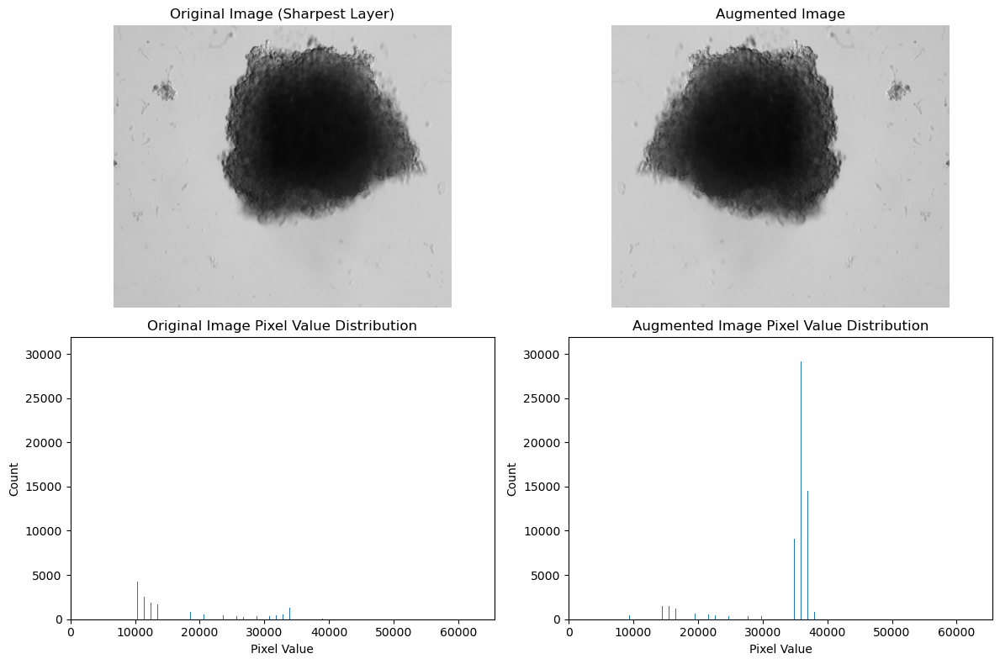

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import torch
from torchvision import transforms

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32)

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Convert the sharpest layer (original image) to a tensor
original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

# Define transformations without using PIL
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=1),
    #transforms.RandomResizedCrop(size=original_image_tensor.shape[1:], scale=(0.8, 1.0)),  # Use tensor size directly
    #transforms.RandomApply([transforms.ColorJitter(brightness=0.5, contrast=0.5)], p=0.8),
    #transforms.RandomGrayscale(p=0.2),
    #transforms.GaussianBlur(kernel_size=(9, 9))
])

# Apply the transformations to the sharpest layer
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.squeeze().numpy()

# Plotting function to count and plot unique values across the full range
def plot_pixel_value_distribution(image, title, ax):
    # Flatten the image and count unique values in the range 0–65535 with bin size 1
    pixel_values = image.flatten().astype(np.uint16)  # Convert to uint16 to ensure values are in the range
    bins = np.arange(0, 65536)  # Bins for every pixel value from 0 to 65535
    
    # Get histogram of pixel values
    counts, _ = np.histogram(pixel_values, bins=bins)
    
    # Plotting the distribution as a bar plot
    ax.bar(bins[:-1], counts, width=1)  # Use width=1 to show each pixel value
    ax.set_title(title)
    ax.set_xlabel('Pixel Value')
    ax.set_ylabel('Count')
    ax.set_xlim([0, 65535])  # Ensure the plot covers the full range

# Create subplots: 2 rows (images + bar plots) and 2 columns (original + augmented)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot original image
axs[0, 0].imshow(original_image, cmap='gray')
axs[0, 0].set_title('Original Image (Sharpest Layer)')
axs[0, 0].axis('off')

# Plot augmented image
axs[0, 1].imshow(augmented_image, cmap='gray')
axs[0, 1].set_title('Augmented Image')
axs[0, 1].axis('off')

# Plot original image pixel value distribution
plot_pixel_value_distribution(original_image, 'Original Image Pixel Value Distribution', axs[1, 0])

# Plot augmented image pixel value distribution
plot_pixel_value_distribution(augmented_image, 'Augmented Image Pixel Value Distribution', axs[1, 1])

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


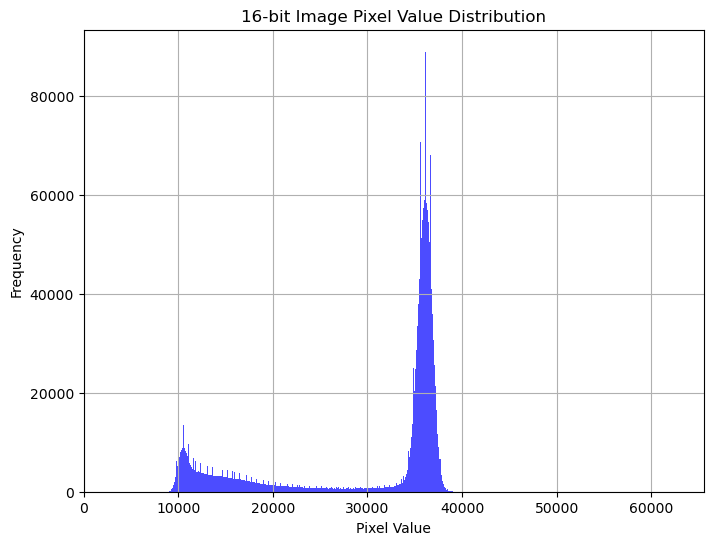

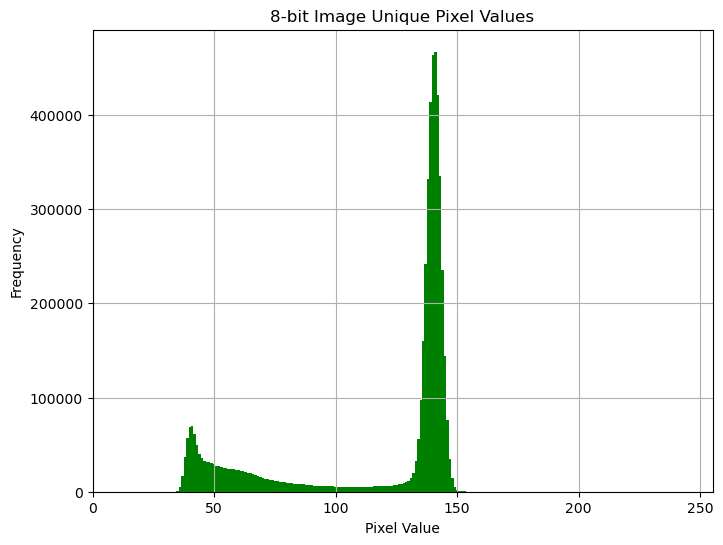

In [26]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the 16-bit TIFF image
image = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff')

# Convert the image to a NumPy array (16-bit)
image_array_16bit = np.array(image)

# Convert 16-bit to 8-bit by scaling down the pixel values
image_array_8bit = (image_array_16bit / 256).astype('uint8')

# Get the unique pixel values and their counts for both 16-bit and 8-bit images
unique_16bit, counts_16bit = np.unique(image_array_16bit, return_counts=True)
unique_8bit, counts_8bit = np.unique(image_array_8bit, return_counts=True)

# Plot histogram for the 16-bit image with 1000 bins
plt.figure(figsize=(8, 6))
plt.hist(image_array_16bit.flatten(), bins=1000, color='blue', alpha=0.7)
plt.title("16-bit Image Pixel Value Distribution")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 65535])  # Limit the x-axis to 16-bit range
plt.grid(True)
plt.show()

# Plot histogram for the 8-bit image
plt.figure(figsize=(8, 6))
plt.bar(unique_8bit, counts_8bit, color='green', width=1)
plt.title("8-bit Image Unique Pixel Values")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 255])
plt.grid(True)
plt.show()


In [ ]:
# 54% reduction

Original Image - Min: 2, Max: 250
Augmented Image - Min: 0.007843137718737125, Max: 0.9803921580314636
Number of unique pixel values in the original image: 144
Number of unique pixel values in the augmented image: 144


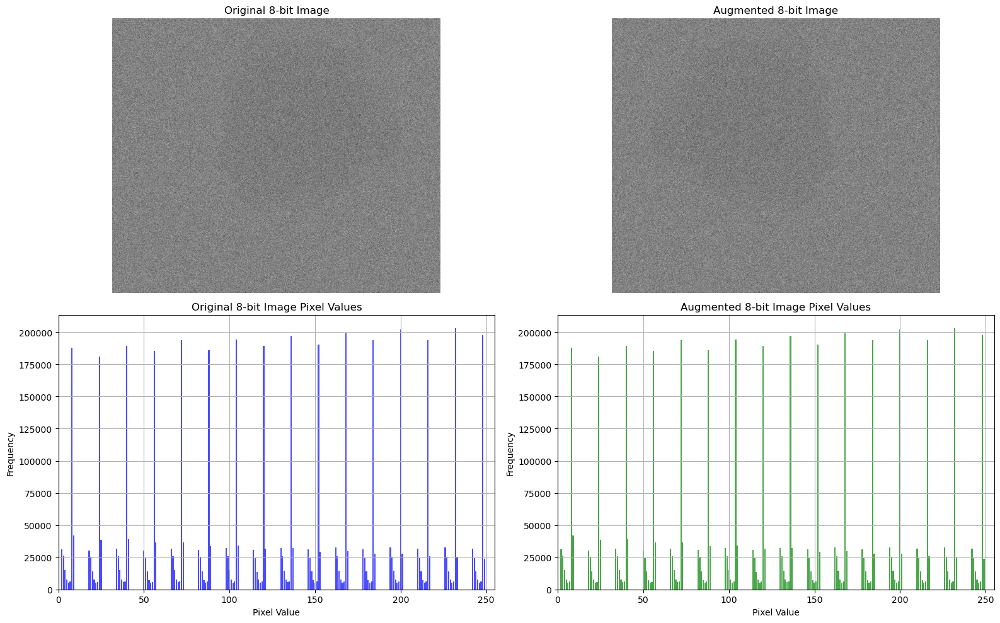

In [7]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2

# Load the 16-bit TIFF image
image = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff')

# Convert the image to a NumPy array (16-bit)
image_array_16bit = np.array(image)

# Convert 16-bit to 8-bit by scaling down the pixel values
image_array_8bit = (image_array_16bit / 256).astype('uint8')

# Convert the 8-bit image array to a PyTorch tensor with float data type
original_image_tensor = torch.tensor(image_array_8bit, dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize to [0, 1]

# Define the transformation
transform = v2.Compose([
    # v2.RandomHorizontalFlip(p=1),
    # v2.RandomResizedCrop(size=(original_image_tensor.shape[1], original_image_tensor.shape[2]), scale=(0.8, 1.0)),
    v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=0.8),
    # v2.RandomGrayscale(p=0.2),
    # v2.GaussianBlur(kernel_size=(9, 9))
])

# Apply the transformations to the original image tensor
augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

# Convert augmented tensor back to numpy array
augmented_image = augmented_image_tensor.squeeze().numpy()  # Remove the channel dimension

# Print min and max pixel values
print(f"Original Image - Min: {image_array_8bit.min()}, Max: {image_array_8bit.max()}")
print(f"Augmented Image - Min: {augmented_image.min()}, Max: {augmented_image.max()}")

# Get unique pixel values and their counts for original and augmented images
unique_original, counts_original = np.unique(image_array_8bit, return_counts=True)
unique_augmented, counts_augmented = np.unique((augmented_image * 255).astype('uint8'), return_counts=True)

# Print the number of unique pixel values
num_unique_original = len(unique_original)
num_unique_augmented = len(unique_augmented)
print(f"Number of unique pixel values in the original image: {num_unique_original}")
print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

# Plot original and augmented images, along with histograms
plt.figure(figsize=(16, 10))

# Original 8-bit image
plt.subplot(2, 2, 1)
plt.imshow(image_array_8bit, cmap='gray')
plt.title("Original 8-bit Image")
plt.axis('off')

# Augmented image
plt.subplot(2, 2, 2)
plt.imshow(augmented_image, cmap='gray')
plt.title("Augmented 8-bit Image")
plt.axis('off')

# Histogram for original 8-bit image
plt.subplot(2, 2, 3)
plt.bar(unique_original, counts_original, color='blue', alpha=0.7)
plt.title("Original 8-bit Image Pixel Values")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 255])
plt.grid(True)

# Histogram for augmented 8-bit image
plt.subplot(2, 2, 4)
plt.bar(unique_augmented, counts_augmented, color='green', alpha=0.7)
plt.title("Augmented 8-bit Image Pixel Values")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.xlim([0, 255])
plt.grid(True)

plt.tight_layout()
plt.show()


Loop 9: Reduction percentage in unique pixel values: 97.81%
Original Image - Min: 33, Max: 170
Augmented Image - Min: 0, Max: 2
Number of unique pixel values in the original image: 137
Number of unique pixel values in the augmented image: 3


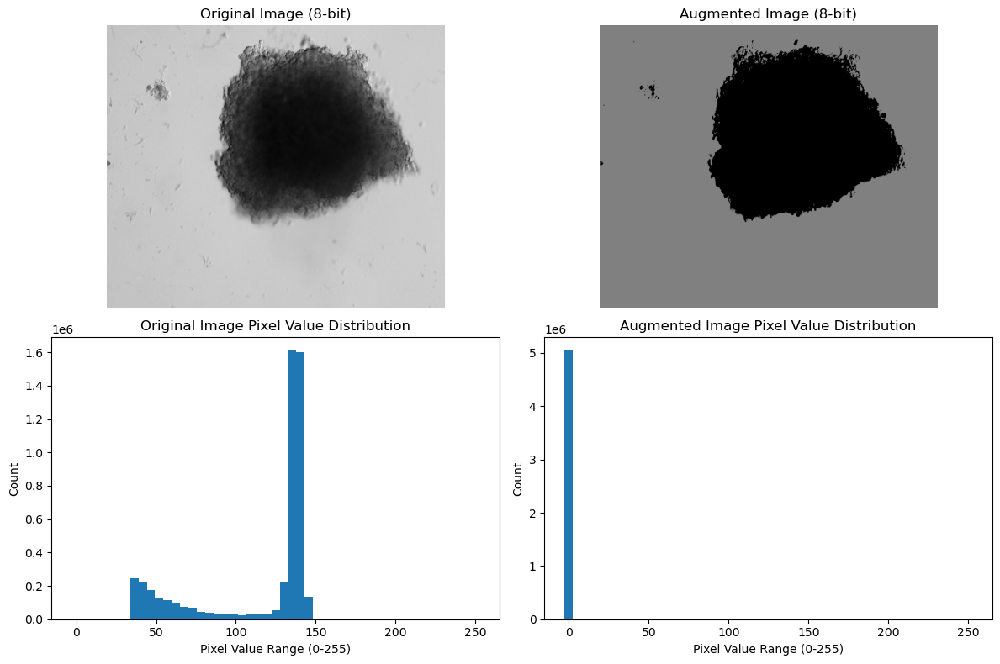


Maximum reduction percentage in unique pixel values: 97.81%
Minimum reduction percentage in unique pixel values: 0.00%


In [21]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2

# Load the 16-bit TIFF image
image = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff')

# Convert the image to a NumPy array (16-bit)
image_array_16bit = np.array(image)

# Convert 16-bit to 8-bit by scaling down the pixel values
image_array_8bit = (image_array_16bit / 256).astype('uint8')

# Prepare a list to store reduction percentages
reduction_percentages = []

# Function to plot pixel value distributions
def plot_pixel_value_distribution(image, title, ax):
    # Get unique pixel values and their counts
    pixel_values, counts = np.unique(image.flatten(), return_counts=True)
    
    # Define the bins for the plot (range between 0 and 255)
    bins = np.linspace(0, 255, 50)  # 50 bins between 0 and 255
    bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

    # Plot the distribution as a bar plot
    ax.bar(bins[:-1], bin_counts, width=(bins[1] - bins[0]))
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-255)')
    ax.set_ylabel('Count')

# Run the transformation for 100 loops
for i in range(100):
    # Convert the 8-bit image array to a PyTorch tensor with float data type
    original_image_tensor = torch.tensor(image_array_8bit, dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize to [0, 1]

    # Define the transformation
    transform = v2.Compose([
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
    ])

    # Apply the transformations to the original image tensor
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()  # Remove the channel dimension

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(image_array_8bit, return_counts=True)
    unique_augmented, counts_augmented = np.unique((augmented_image * 255).astype('uint8'), return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)
    
    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Check if reduction percentage is >= 99%, break the loop, and visualize
    if reduction_percentage >= 97:
        print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")
        print(f"Original Image - Min: {image_array_8bit.min()}, Max: {image_array_8bit.max()}")
        print(f"Augmented Image - Min: {(augmented_image * 255).astype('uint8').min()}, Max: {(augmented_image * 255).astype('uint8').max()}")
        print(f"Number of unique pixel values in the original image: {num_unique_original}")
        print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

        # Visualize the original and augmented images
        fig, axs = plt.subplots(2, 2, figsize=(12, 8))

        # Plot original image
        axs[0, 0].imshow(image_array_8bit, cmap='gray')
        axs[0, 0].set_title('Original Image (8-bit)')
        axs[0, 0].axis('off')

        # Plot augmented image
        axs[0, 1].imshow((augmented_image * 255).astype('uint8'), cmap='gray')
        axs[0, 1].set_title('Augmented Image (8-bit)')
        axs[0, 1].axis('off')

        # Plot pixel value distribution for original image
        plot_pixel_value_distribution(image_array_8bit, 'Original Image Pixel Value Distribution', axs[1, 0])

        # Plot pixel value distribution for augmented image
        plot_pixel_value_distribution((augmented_image * 255).astype('uint8'), 'Augmented Image Pixel Value Distribution', axs[1, 1])

        # Adjust layout
        plt.tight_layout()
        plt.show()

        # Break the loop since the condition is met
        break

# Find the maximum and minimum reduction percentages
max_reduction = max(reduction_percentages)
min_reduction = min(reduction_percentages)
print(f"\nMaximum reduction percentage in unique pixel values: {max_reduction:.2f}%")
print(f"Minimum reduction percentage in unique pixel values: {min_reduction:.2f}%")


Loop 26: Reduction percentage in unique pixel values: 99.27%
Original Image - Min: 33, Max: 170
Augmented Image - Min: 3, Max: 3
Number of unique pixel values in the original image: 137
Number of unique pixel values in the augmented image: 1


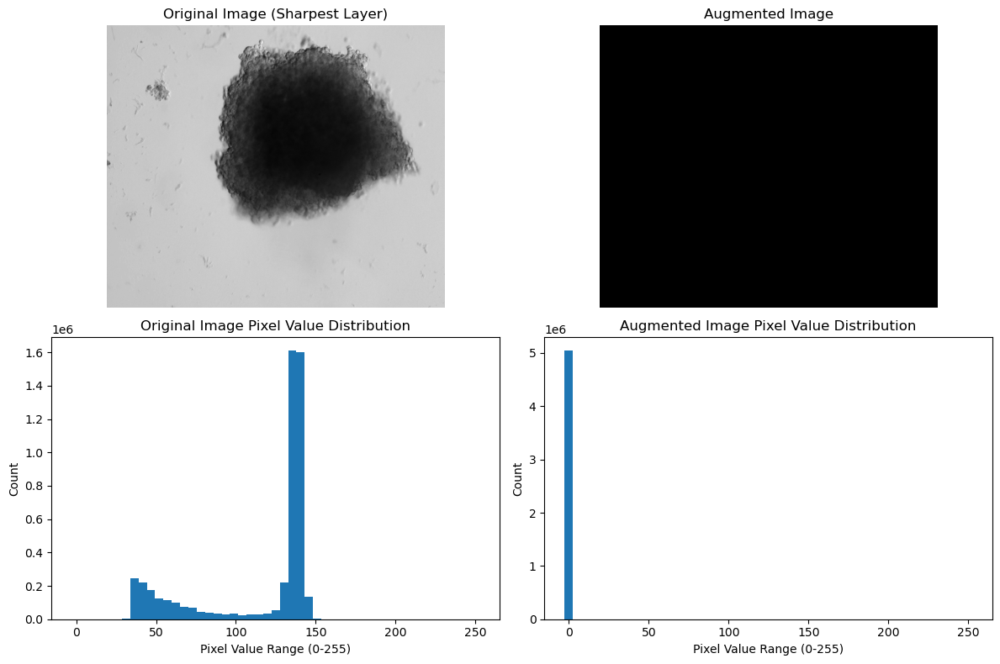


Maximum reduction percentage in unique pixel values: 99.27%
Minimum reduction percentage in unique pixel values: 0.00%


In [22]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff

# Load the 16-bit TIFF image
image = tiff.imread(r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff').astype(np.float32)

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Convert the sharpest layer (original image) to an 8-bit format
original_image_8bit = (original_image / 256).astype('uint8')

# Prepare a list to store reduction percentages
reduction_percentages = []

# Function to plot pixel value distributions
def plot_pixel_value_distribution(image, title, ax):
    # Get unique pixel values and their counts
    pixel_values, counts = np.unique(image.flatten(), return_counts=True)
    
    # Define the bins for the plot (range between 0 and 255)
    bins = np.linspace(0, 255, 50)  # 50 bins between 0 and 255
    bin_counts = np.histogram(pixel_values, bins=bins, weights=counts)[0]

    # Plot the distribution as a bar plot
    ax.bar(bins[:-1], bin_counts, width=(bins[1] - bins[0]))
    ax.set_title(title)
    ax.set_xlabel('Pixel Value Range (0-255)')
    ax.set_ylabel('Count')

# Run the transformation for 100 loops
for i in range(100):
    # Convert the original image array to a PyTorch tensor with float data type
    original_image_tensor = torch.tensor(original_image_8bit, dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize to [0, 1]

    # Define the transformation
    transform = v2.Compose([
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
    ])

    # Apply the transformations to the original image tensor
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()  # Remove the channel dimension

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(original_image_8bit, return_counts=True)
    unique_augmented, counts_augmented = np.unique((augmented_image * 255).astype('uint8'), return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)

    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Check if reduction percentage is >= 99%, break the loop, and visualize
    if reduction_percentage >= 99:
        print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")
        print(f"Original Image - Min: {original_image_8bit.min()}, Max: {original_image_8bit.max()}")
        print(f"Augmented Image - Min: {(augmented_image * 255).astype('uint8').min()}, Max: {(augmented_image * 255).astype('uint8').max()}")
        print(f"Number of unique pixel values in the original image: {num_unique_original}")
        print(f"Number of unique pixel values in the augmented image: {num_unique_augmented}")

        # Visualize the original and augmented images
        fig, axs = plt.subplots(2, 2, figsize=(12, 8))

        # Plot original image
        axs[0, 0].imshow(original_image_8bit, cmap='gray')
        axs[0, 0].set_title('Original Image (Sharpest Layer)')
        axs[0, 0].axis('off')

        # Plot augmented image
        axs[0, 1].imshow((augmented_image * 255).astype('uint8'), cmap='gray')
        axs[0, 1].set_title('Augmented Image')
        axs[0, 1].axis('off')

        # Plot pixel value distribution for original image
        plot_pixel_value_distribution(original_image_8bit, 'Original Image Pixel Value Distribution', axs[1, 0])

        # Plot pixel value distribution for augmented image
        plot_pixel_value_distribution((augmented_image * 255).astype('uint8'), 'Augmented Image Pixel Value Distribution', axs[1, 1])

        # Adjust layout
        plt.tight_layout()
        plt.show()

        # Break the loop since the condition is met
        break

# Find the maximum and minimum reduction percentages
max_reduction = max(reduction_percentages)
min_reduction = min(reduction_percentages)
print(f"\nMaximum reduction percentage in unique pixel values: {max_reduction:.2f}%")
print(f"Minimum reduction percentage in unique pixel values: {min_reduction:.2f}%")


In [47]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2

# Load the 16-bit TIFF image
image = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff')

# Convert the image to a NumPy array (16-bit)
image_array_16bit = np.array(image)

# Convert 16-bit to 8-bit by scaling down the pixel values
image_array_8bit = (image_array_16bit / 256).astype('uint8')

# Prepare a list to store reduction percentages
reduction_percentages = []

# Run the transformation for 100 loops
for i in range(100):
    # Convert the 8-bit image array to a PyTorch tensor with float data type
    original_image_tensor = torch.tensor(image_array_8bit, dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize to [0, 1]

    # Define the transformation
    transform = v2.Compose([
        # v2.RandomHorizontalFlip(p=1),
        # v2.RandomResizedCrop(size=(original_image_tensor.shape[1], original_image_tensor.shape[2]), scale=(0.8, 1.0)),
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
        # v2.RandomGrayscale(p=0.2),
        # v2.GaussianBlur(kernel_size=(9, 9))
    ])

    # Apply the transformations to the original image tensor
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()  # Remove the channel dimension

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(image_array_8bit, return_counts=True)
    unique_augmented, counts_augmented = np.unique((augmented_image * 255).astype('uint8'), return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)

    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Print the reduction percentage for the current loop
    print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")

# Find the maximum and minimum reduction percentages
max_reduction = max(reduction_percentages)
min_reduction = min(reduction_percentages)
print(f"\nMaximum reduction percentage in unique pixel values: {max_reduction:.2f}%")
print(f"Minimum reduction percentage in unique pixel values: {min_reduction:.2f}%")


Loop 1: Reduction percentage in unique pixel values: 27.74%
Loop 2: Reduction percentage in unique pixel values: 81.02%
Loop 3: Reduction percentage in unique pixel values: 32.12%
Loop 4: Reduction percentage in unique pixel values: 70.80%
Loop 5: Reduction percentage in unique pixel values: 8.76%
Loop 6: Reduction percentage in unique pixel values: 48.91%
Loop 7: Reduction percentage in unique pixel values: 17.52%
Loop 8: Reduction percentage in unique pixel values: 93.43%
Loop 9: Reduction percentage in unique pixel values: 37.23%
Loop 10: Reduction percentage in unique pixel values: 89.78%
Loop 11: Reduction percentage in unique pixel values: 27.74%
Loop 12: Reduction percentage in unique pixel values: 78.83%
Loop 13: Reduction percentage in unique pixel values: 42.34%
Loop 14: Reduction percentage in unique pixel values: 97.08%
Loop 15: Reduction percentage in unique pixel values: 13.14%
Loop 16: Reduction percentage in unique pixel values: 32.12%
Loop 17: Reduction percentage in u

In [57]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Calculate sharpness for each layer
sharpness_scores = []
for i in range(3):
    layer = image[i]
    gy, gx = np.gradient(layer)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    sharpness_scores.append(sharpness)

# Get the sharpest layer (considered the original image)
sharpest_layer_index = np.argmax(sharpness_scores)
original_image = image[sharpest_layer_index]

# Prepare a list to store reduction percentages
reduction_percentages = []

# Run the transformation for 100 loops
for i in range(1000):
    # Convert the sharpest layer to a tensor
    original_image_tensor = torch.from_numpy(original_image).unsqueeze(0)  # Add channel dimension

    # Define transformations without using PIL
    transform = v2.Compose([
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=1),
    ])

    # Apply the transformations to the sharpest layer
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(original_image, return_counts=True)
    unique_augmented, counts_augmented = np.unique(augmented_image, return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)
    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Print the reduction percentage for the current loop
    print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")

# Find the maximum and minimum reduction percentages
max_reduction = max(reduction_percentages)
min_reduction = min(reduction_percentages)
print(f"\nMaximum reduction percentage in unique pixel values: {max_reduction:.2f}%")
print(f"Minimum reduction percentage in unique pixel values: {min_reduction:.2f}%")


Loop 1: Reduction percentage in unique pixel values: -3.08%
Loop 2: Reduction percentage in unique pixel values: 13.45%
Loop 3: Reduction percentage in unique pixel values: 8.57%
Loop 4: Reduction percentage in unique pixel values: -0.33%
Loop 5: Reduction percentage in unique pixel values: 26.01%
Loop 6: Reduction percentage in unique pixel values: 16.72%
Loop 7: Reduction percentage in unique pixel values: 28.14%
Loop 8: Reduction percentage in unique pixel values: 0.00%
Loop 9: Reduction percentage in unique pixel values: -0.24%
Loop 10: Reduction percentage in unique pixel values: 0.00%
Loop 11: Reduction percentage in unique pixel values: 11.94%
Loop 12: Reduction percentage in unique pixel values: 0.00%
Loop 13: Reduction percentage in unique pixel values: 17.72%
Loop 14: Reduction percentage in unique pixel values: 35.43%
Loop 15: Reduction percentage in unique pixel values: 15.49%
Loop 16: Reduction percentage in unique pixel values: 9.00%
Loop 17: Reduction percentage in uniqu

In [49]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import v2
import tifffile as tiff

# Load the image
img_path = r'C:\Users\k54739\Bibin Babu\thesis\Data_supervised\drug_screened\B06-T01.tiff'
image = tiff.imread(img_path)

# Ensure the image has 3 layers (channels)
if image.shape[0] != 3:
    raise ValueError(f"Image {img_path} does not have exactly 3 layers.")

# Convert to float32 for compatibility with transformations
image = image.astype(np.float32) / 65535.0

# Prepare a list to store reduction percentages
reduction_percentages = []

# Run the transformation for 100 loops
for i in range(100):
    # Convert the image to a tensor
    original_image_tensor = torch.from_numpy(image).unsqueeze(0)  # Add channel dimension

    # Define transformations without using PIL
    transform = v2.Compose([
        v2.RandomApply([v2.ColorJitter(brightness=1, contrast=1, saturation=1, hue=0)], p=0.8),
    ])

    # Apply the transformations to the entire image
    augmented_image_tensor = transform(original_image_tensor)  # Transformation directly on tensor

    # Convert augmented tensor back to numpy array
    augmented_image = augmented_image_tensor.squeeze().numpy()

    # Get unique pixel values and their counts for original and augmented images
    unique_original, counts_original = np.unique(image, return_counts=True)
    unique_augmented, counts_augmented = np.unique(augmented_image, return_counts=True)

    # Calculate the reduction percentage
    num_unique_original = len(unique_original)
    num_unique_augmented = len(unique_augmented)
    reduction_percentage = ((num_unique_original - num_unique_augmented) / num_unique_original) * 100
    reduction_percentages.append(reduction_percentage)

    # Print the reduction percentage for the current loop
    print(f"Loop {i + 1}: Reduction percentage in unique pixel values: {reduction_percentage:.2f}%")

# Find the maximum and minimum reduction percentages
max_reduction = max(reduction_percentages)
min_reduction = min(reduction_percentages)
print(f"\nMaximum reduction percentage in unique pixel values: {max_reduction:.2f}%")
print(f"Minimum reduction percentage in unique pixel values: {min_reduction:.2f}%")


Loop 1: Reduction percentage in unique pixel values: -54307.87%
Loop 2: Reduction percentage in unique pixel values: -148528.21%
Loop 3: Reduction percentage in unique pixel values: -225022.55%
Loop 4: Reduction percentage in unique pixel values: -197136.03%
Loop 5: Reduction percentage in unique pixel values: -206017.95%
Loop 6: Reduction percentage in unique pixel values: -156228.26%
Loop 7: Reduction percentage in unique pixel values: -102106.72%
Loop 8: Reduction percentage in unique pixel values: -204074.28%
Loop 9: Reduction percentage in unique pixel values: -107511.23%
Loop 10: Reduction percentage in unique pixel values: -103927.61%
Loop 11: Reduction percentage in unique pixel values: -55549.33%
Loop 12: Reduction percentage in unique pixel values: -185327.47%
Loop 13: Reduction percentage in unique pixel values: -134396.78%
Loop 14: Reduction percentage in unique pixel values: -192269.95%
Loop 15: Reduction percentage in unique pixel values: -171559.41%
Loop 16: Reduction pe

conclusion: we can't use 3 layer for v2. color jitter since its increase brightness or something else which will be completely out of dataset distribution. ( increase in unique values -109318.50% ) visually it doesn't make sense, I mean if its all more white then the number of unique channel should reduce right ? maybe the increase happend  in close like , 65355, 653554 , 65353, 65352,65351, 653530 etc.

problem is we need to use 3 channel if we are using pretrained mri unet since its require. ( maybe not we can change the unet model to handle single channel as input)
but with one channel it works. for 100 epochs percentage of reduction is max 48% and increase the unique pixel values by 5 percentage
for 8 bit its 99%.

In [8]:
from PIL import Image
from pix2tex.cli import LatexOCR

c:\Users\k54739\.conda\envs\master\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
img = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Manuscript\notes\figures\one eq.PNG')
model = LatexOCR()
print(model(img))

download weights v0.0.1 to path c:\Users\k54739\.conda\envs\master\Lib\site-packages\pix2tex\model\checkpoints


weights.pth: 100%|██████████| 97.4M/97.4M [00:08<00:00, 11.5Mb/s]
image_resizer.pth: 100%|██████████| 18.5M/18.5M [00:01<00:00, 10.4Mb/s]
c:\Users\k54739\.conda\envs\master\Lib\site-packages\pix2tex\cli.py:84: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Ple

\Im\,[k{\underline{{r}}}i]\in\:\left\{0,\:1\,\right\}


In [11]:
img = Image.open(r'C:\Users\k54739\Bibin Babu\thesis\Manuscript\notes\figures\one eq.PNG')
print(model(img))

\Im\,[k{\bf{z}}i]\,\in\,\not\left\{0,\,1\,\right\}


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
import torch

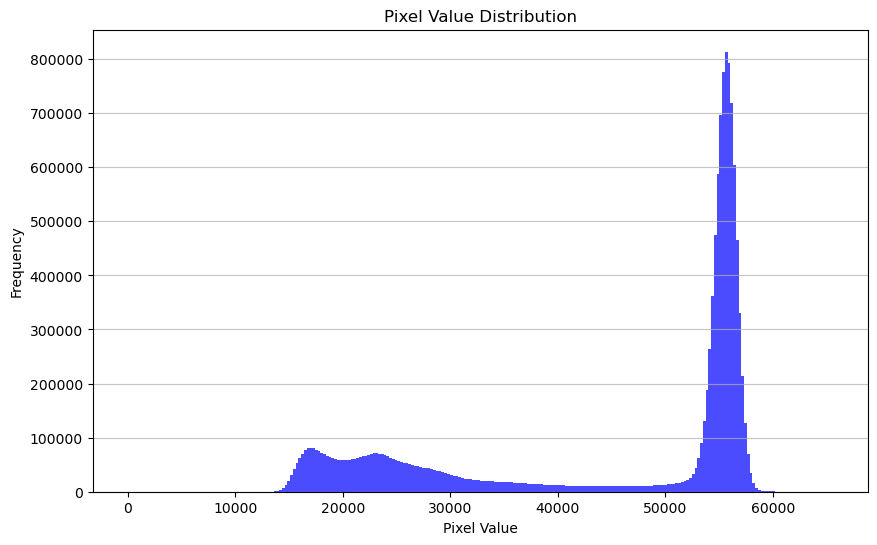

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff

# Load the 16-bit TIFF image
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)

# Flatten the image to 1D array
pixel_values = image.flatten()

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(pixel_values, bins=256, range=(0, 65535), color='blue', alpha=0.7)
plt.title('Pixel Value Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


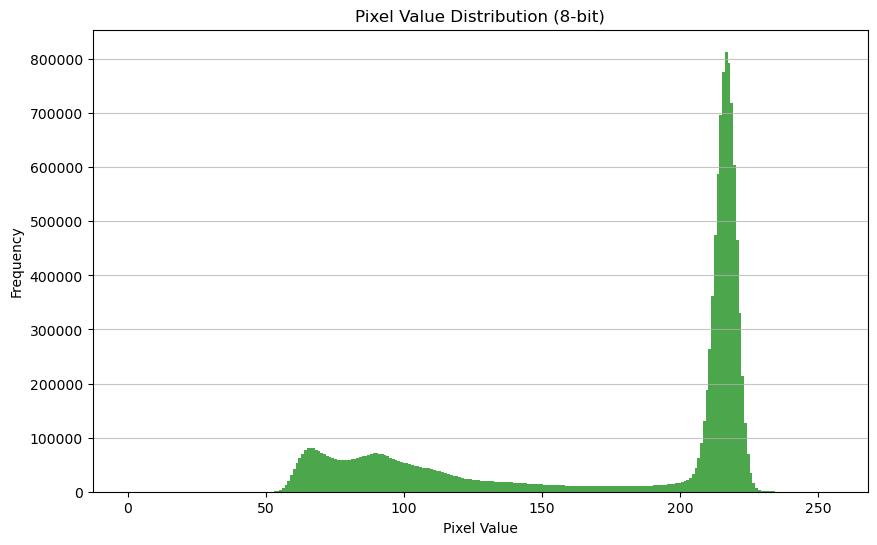

In [6]:
# Convert 16-bit to 8-bit
image_8bit = (image / 256).astype(np.uint8)  # Divide by 256 to scale and convert to 8-bit

# Flatten the 8-bit image to a 1D array
pixel_values_8bit = image_8bit.flatten()

# Plot the histogram for 8-bit pixel values
plt.figure(figsize=(10, 6))
plt.hist(pixel_values_8bit, bins=256, range=(0, 255), color='green', alpha=0.7)
plt.title('Pixel Value Distribution (8-bit)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


TypeError: Invalid shape (3, 2054, 2054) for image data

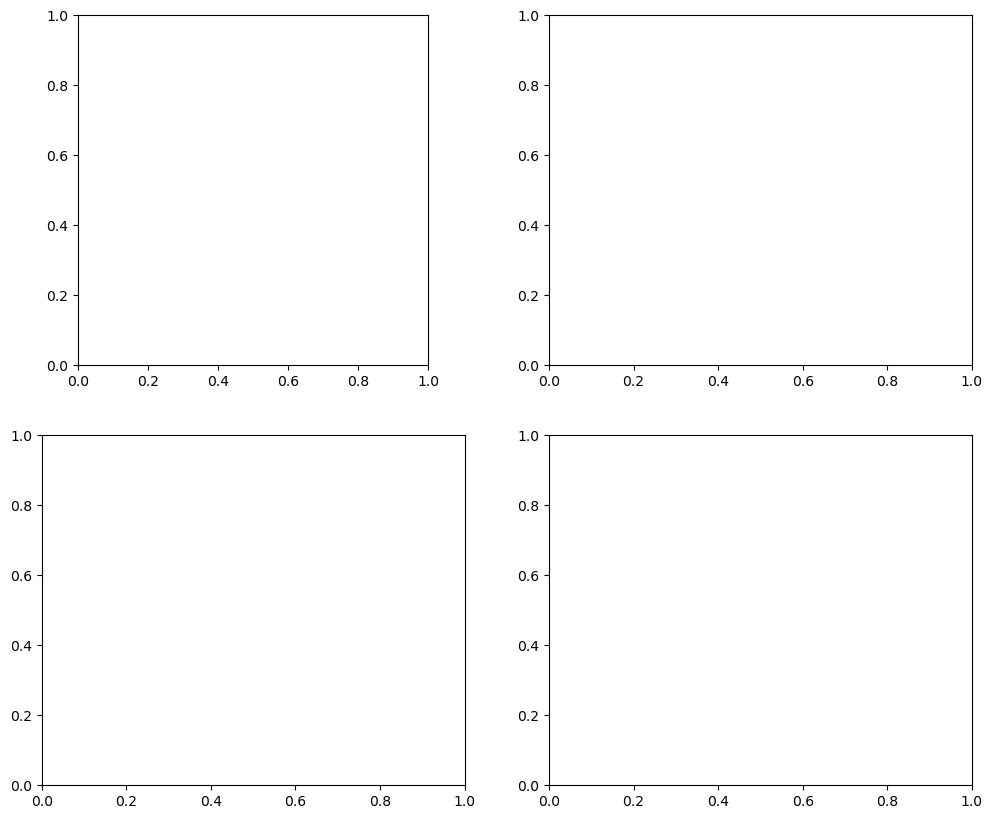

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff

# Load the 16-bit TIFF image
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)

# Convert 16-bit to 8-bit
image_8bit = (image / 256).astype(np.uint8)  # Divide by 256 to scale and convert to 8-bit

# Flatten images for histogram plotting
pixel_values_16bit = image.flatten()
pixel_values_8bit = image_8bit.flatten()

# Plot the images and their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# 16-bit original image
axs[0, 0].imshow(image, cmap='gray', vmin=0, vmax=65535)
axs[0, 0].set_title('16-bit Original Image')
axs[0, 0].axis('off')

# 16-bit pixel value distribution
axs[0, 1].hist(pixel_values_16bit, bins=256, range=(0, 65535), color='blue', alpha=0.7)
axs[0, 1].set_title('16-bit Pixel Value Distribution')
axs[0, 1].set_xlabel('Pixel Value')
axs[0, 1].set_ylabel('Frequency')

# 8-bit converted image
axs[1, 0].imshow(image_8bit, cmap='gray', vmin=0, vmax=255)
axs[1, 0].set_title('8-bit Converted Image')
axs[1, 0].axis('off')

# 8-bit pixel value distribution
axs[1, 1].hist(pixel_values_8bit, bins=256, range=(0, 255), color='green', alpha=0.7)
axs[1, 1].set_title('8-bit Pixel Value Distribution')
axs[1, 1].set_xlabel('Pixel Value')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


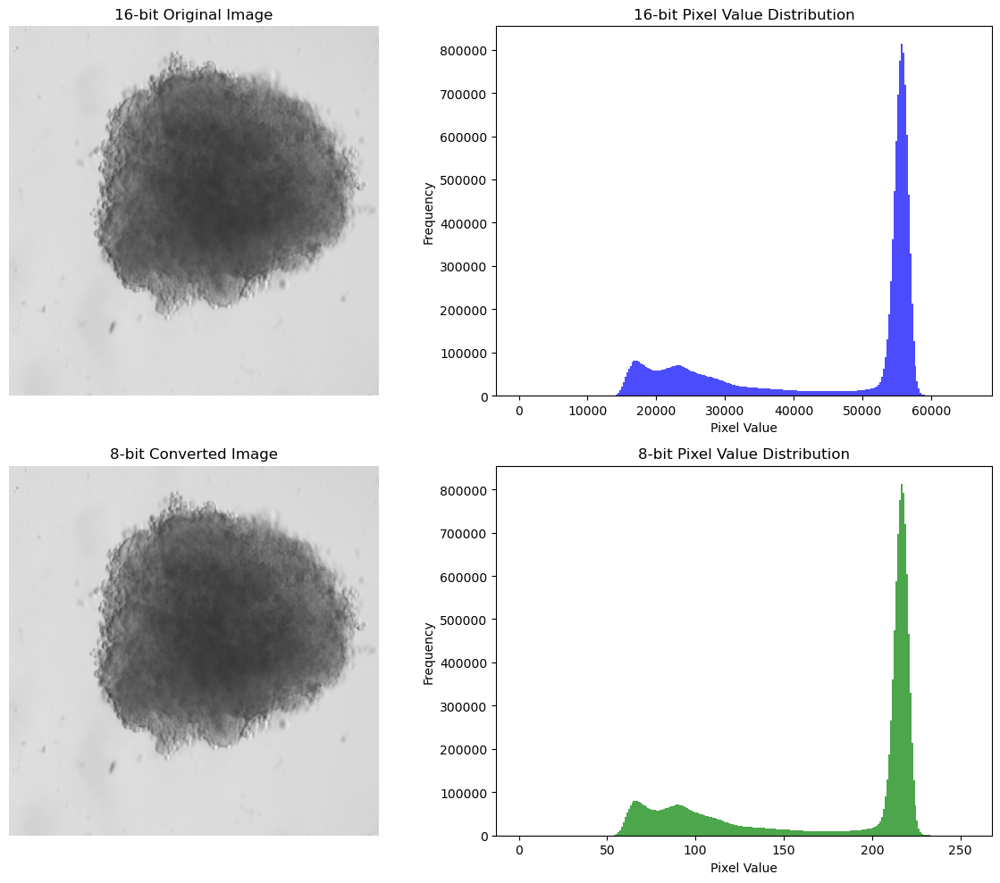

In [9]:
# Transpose the image for visualization
image_transposed = np.transpose(image, (1, 2, 0))  # Shape becomes (2054, 2054, 3)

# Plot the images and their pixel value distributions
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# 16-bit original image (Visualize only the first channel or all channels averaged)
axs[0, 0].imshow(image[0], cmap='gray', vmin=0, vmax=65535)  # Visualize the first channel
axs[0, 0].set_title('16-bit Original Image')
axs[0, 0].axis('off')

# 16-bit pixel value distribution
pixel_values_16bit = image.flatten()  # Use all channels
axs[0, 1].hist(pixel_values_16bit, bins=256, range=(0, 65535), color='blue', alpha=0.7)
axs[0, 1].set_title('16-bit Pixel Value Distribution')
axs[0, 1].set_xlabel('Pixel Value')
axs[0, 1].set_ylabel('Frequency')

# 8-bit converted image
image_8bit = (image / 256).astype(np.uint8)
image_8bit_transposed = np.transpose(image_8bit, (1, 2, 0))  # Shape becomes (2054, 2054, 3)
axs[1, 0].imshow(image_8bit_transposed[:, :, 0], cmap='gray', vmin=0, vmax=255)  # Visualize the first channel
axs[1, 0].set_title('8-bit Converted Image')
axs[1, 0].axis('off')

# 8-bit pixel value distribution
pixel_values_8bit = image_8bit.flatten()  # Use all channels
axs[1, 1].hist(pixel_values_8bit, bins=256, range=(0, 255), color='green', alpha=0.7)
axs[1, 1].set_title('8-bit Pixel Value Distribution')
axs[1, 1].set_xlabel('Pixel Value')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()


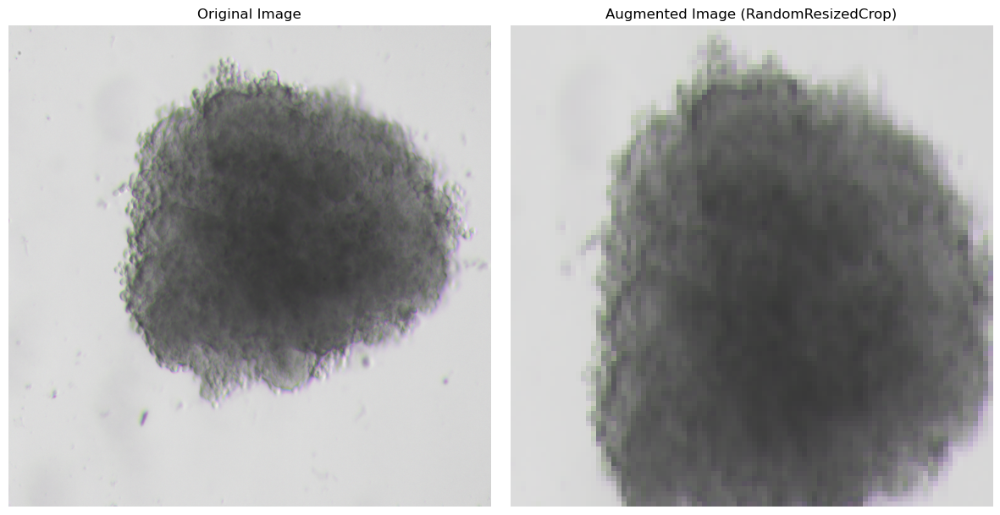

In [14]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import tifffile as tiff  # Ensure tiff is imported

# Load and normalize the image
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)

# Normalize to [0, 1] range
image = image.astype(np.float32) / 65535.0

# Convert to a torch tensor
image_tensor = torch.tensor(image, dtype=torch.float32)  # Shape: (3, 2054, 2054)

# Define the transform
random_resized_crop = transforms.RandomResizedCrop(size=96, scale=(0.4, 1.0))

# Apply the transform (requires image to be a torch tensor with shape [C, H, W])
augmented_image = random_resized_crop(image_tensor)

# Convert tensors back to numpy arrays for visualization
# Transpose to (H, W, 3) for RGB-like visualization
original_image_np = image_tensor.permute(1, 2, 0).numpy()
augmented_image_np = augmented_image.permute(1, 2, 0).numpy()

# Plot the original and augmented images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(original_image_np, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Augmented Image
axs[1].imshow(augmented_image_np, cmap='gray')
axs[1].set_title('Augmented Image (RandomResizedCrop)')
axs[1].axis('off')

plt.tight_layout()
plt.show()


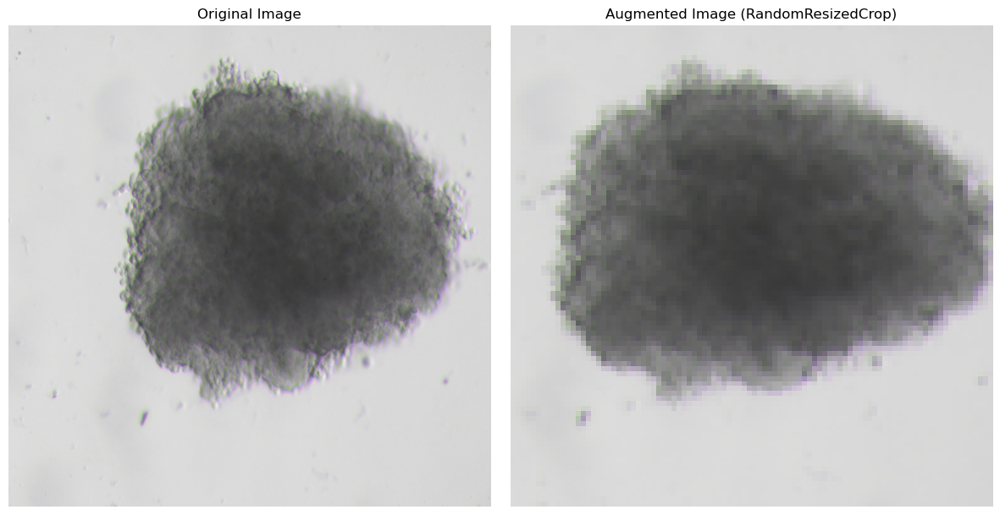

In [15]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import tifffile as tiff  # Ensure tiff is imported

# Load and normalize the image
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)

# Normalize to [0, 1] range
image = image.astype(np.float32) / 65535.0

# Convert to a torch tensor
image_tensor = torch.tensor(image, dtype=torch.float32)  # Shape: (3, 2054, 2054)

# Define the transform
random_resized_crop = transforms.RandomResizedCrop(size=96, scale=(0.4, 1.0))

# Apply the transform (requires image to be a torch tensor with shape [C, H, W])
augmented_image = random_resized_crop(image_tensor)

# Convert tensors back to numpy arrays for visualization
# Transpose to (H, W, 3) for RGB-like visualization
original_image_np = image_tensor.permute(1, 2, 0).numpy()
augmented_image_np = augmented_image.permute(1, 2, 0).numpy()

# Plot the original and augmented images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(original_image_np, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Augmented Image
axs[1].imshow(augmented_image_np, cmap='gray')
axs[1].set_title('Augmented Image (RandomResizedCrop)')
axs[1].axis('off')

plt.tight_layout()
plt.show()


In [16]:
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)
image.shape

(3, 2054, 2054)

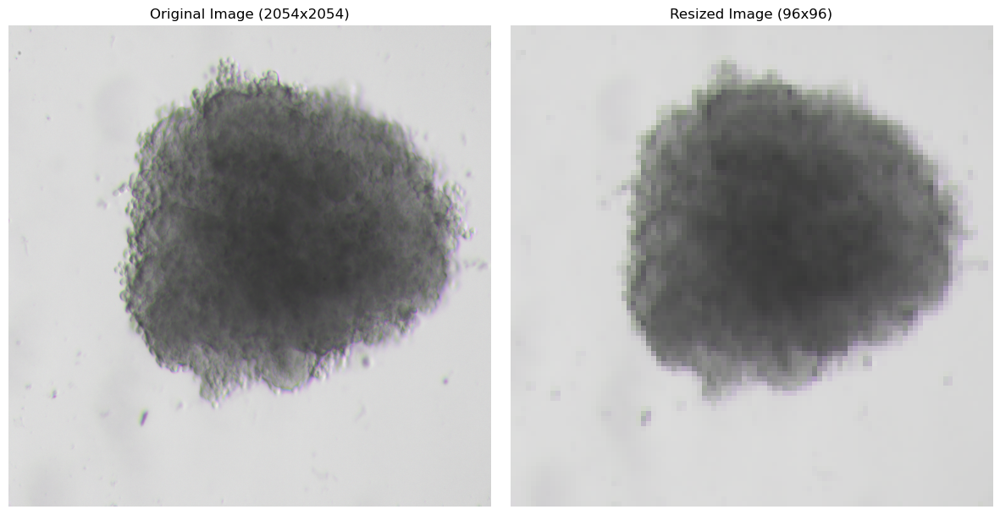

In [21]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import tifffile as tiff  # Ensure tiff is imported

# Load and normalize the image
img_path = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image = tiff.imread(img_path)

# Normalize to [0, 1] range
image = image.astype(np.float32) / 65535.0

# Convert to a torch tensor
image_tensor = torch.tensor(image, dtype=torch.float32)  # Shape: (3, 2054, 2054)

# Define the resize transform
resize_transform = transforms.Resize(size=(96, 96))

# Convert to shape [C, H, W] for transforms
image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension for transform compatibility

# Apply the resize transform
resized_image = resize_transform(image_tensor)

# Remove batch dimension and convert to numpy
resized_image = resized_image.squeeze(0)  # Remove batch dimension
original_image_np = image_tensor.squeeze(0).permute(1, 2, 0).numpy()
resized_image_np = resized_image.permute(1, 2, 0).numpy()

# Plot the original and resized images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(original_image_np, cmap='gray')
axs[0].set_title('Original Image (2054x2054)')
axs[0].axis('off')

# Resized Image
axs[1].imshow(resized_image_np, cmap='gray')
axs[1].set_title('Resized Image (96x96)')
axs[1].axis('off')

plt.tight_layout()
plt.show()


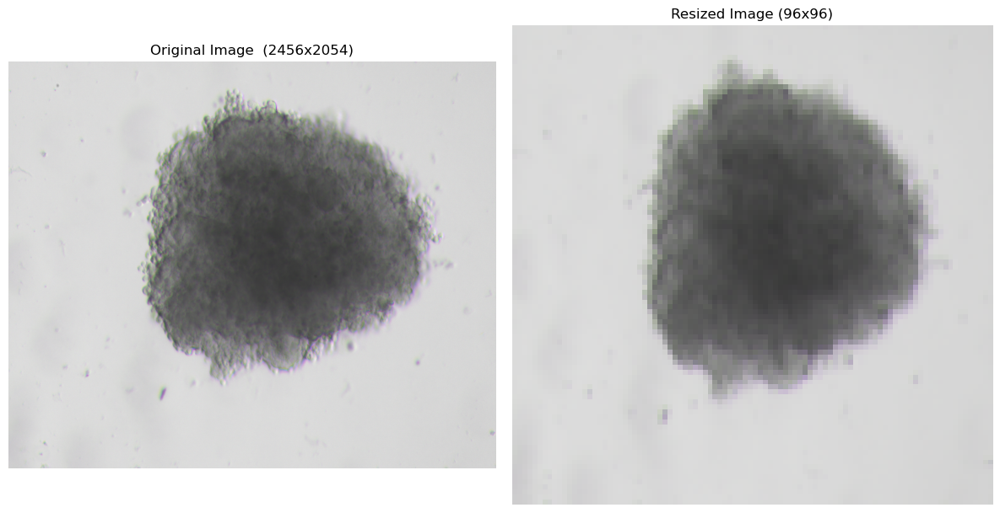

In [22]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import tifffile as tiff  # Ensure tiff is imported

# Load and normalize the image
img_path = r'C:\Users\k54739\Today_data\test\D07-T01.tiff'
image = tiff.imread(img_path)

# Normalize to [0, 1] range
image = image.astype(np.float32) / 65535.0

# Convert to a torch tensor
image_tensor = torch.tensor(image, dtype=torch.float32)  # Shape: (3, 2054, 2054)

# Define the resize transform
resize_transform = transforms.Resize(size=(96, 96))

# Convert to shape [C, H, W] for transforms
image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension for transform compatibility

# Apply the resize transform
resized_image = resize_transform(image_tensor)

# Remove batch dimension and convert to numpy
resized_image = resized_image.squeeze(0)  # Remove batch dimension
original_image_np = image_tensor.squeeze(0).permute(1, 2, 0).numpy()
resized_image_np = resized_image.permute(1, 2, 0).numpy()

# Plot the original and resized images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(original_image_np, cmap='gray')
axs[0].set_title('Original Image  (2456x2054)')
axs[0].axis('off')

# Resized Image
axs[1].imshow(resized_image_np, cmap='gray')
axs[1].set_title('Resized Image (96x96)')
axs[1].axis('off')

plt.tight_layout()
plt.show()


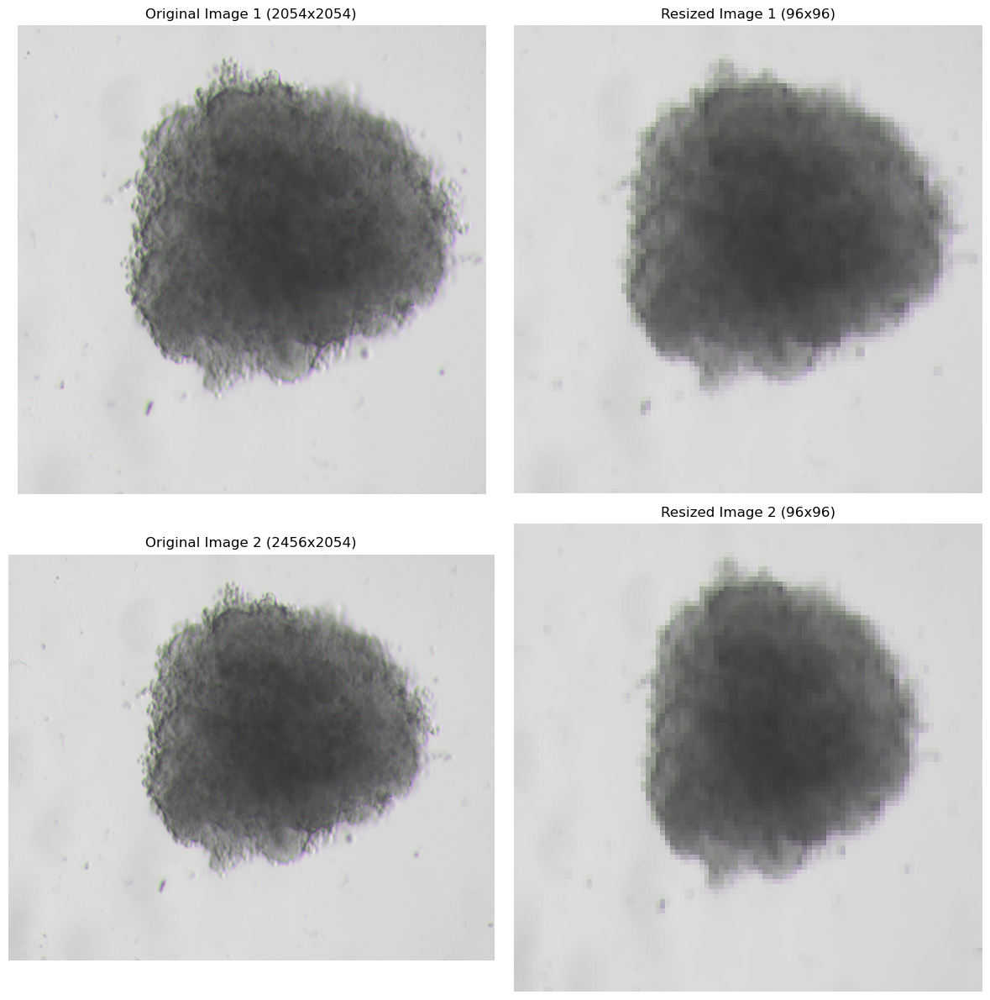

In [23]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
import tifffile as tiff  # Ensure tiff is imported

# First image
img_path1 = r'C:\Users\k54739\Bibi_new_thesis\thesis\Data_clustering\croped_20images\control10\cond10_RBT_DS_4.1_D07-T01.tiff'
image1 = tiff.imread(img_path1)

# Normalize to [0, 1] range
image1 = image1.astype(np.float32) / 65535.0
image_tensor1 = torch.tensor(image1, dtype=torch.float32)
resize_transform = transforms.Resize(size=(96, 96))

# Convert to shape [C, H, W] for transforms
image_tensor1 = image_tensor1.unsqueeze(0)
resized_image1 = resize_transform(image_tensor1)

# Remove batch dimension and convert to numpy
resized_image1 = resized_image1.squeeze(0)
original_image_np1 = image_tensor1.squeeze(0).permute(1, 2, 0).numpy()
resized_image_np1 = resized_image1.permute(1, 2, 0).numpy()

# Second image
img_path2 = r'C:\Users\k54739\Today_data\test\D07-T01.tiff'
image2 = tiff.imread(img_path2)

# Normalize to [0, 1] range
image2 = image2.astype(np.float32) / 65535.0
image_tensor2 = torch.tensor(image2, dtype=torch.float32)

# Convert to shape [C, H, W] for transforms
image_tensor2 = image_tensor2.unsqueeze(0)
resized_image2 = resize_transform(image_tensor2)

# Remove batch dimension and convert to numpy
resized_image2 = resized_image2.squeeze(0)
original_image_np2 = image_tensor2.squeeze(0).permute(1, 2, 0).numpy()
resized_image_np2 = resized_image2.permute(1, 2, 0).numpy()

# Combined plot
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Top row: First image
axs[0, 0].imshow(original_image_np1, cmap='gray')
axs[0, 0].set_title('Original Image 1 (2054x2054)')
axs[0, 0].axis('off')

axs[0, 1].imshow(resized_image_np1, cmap='gray')
axs[0, 1].set_title('Resized Image 1 (96x96)')
axs[0, 1].axis('off')

# Bottom row: Second image
axs[1, 0].imshow(original_image_np2, cmap='gray')
axs[1, 0].set_title('Original Image 2 (2456x2054)')
axs[1, 0].axis('off')

axs[1, 1].imshow(resized_image_np2, cmap='gray')
axs[1, 1].set_title('Resized Image 2 (96x96)')
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()
